In [8]:
#!pip install tensorflow

  Using cached https://files.pythonhosted.org/packages/c8/fc/56c4e9818ebdcc2b7fa449001772227f0108ba152f36b3e2732d20d8c16c/tensorflow-2.7.0-cp37-cp37m-win_amd64.whl
  Stored in directory: C:\Users\Rajeev\AppData\Local\pip\Cache\wheels\7c\06\54\bc84598ba1daf8f970247f550b175aaaee85f68b4b0c5ab2c6
Successfully built termcolor
  Found existing installation: setuptools 40.8.0
    Uninstalling setuptools-40.8.0:
      Successfully uninstalled setuptools-40.8.0
  Found existing installation: requests 2.18.4
    Uninstalling requests-2.18.4:
      Successfully uninstalled requests-2.18.4
  Found existing installation: zipp 0.3.3
    Uninstalling zipp-0.3.3:
      Successfully uninstalled zipp-0.3.3
  Found existing installation: importlib-metadata 0.0.0
    Uninstalling importlib-metadata-0.0.0:
      Successfully uninstalled importlib-metadata-0.0.0


conda 4.10.3 requires ruamel_yaml_conda>=0.11.14, which is not installed.
mxnet 1.7.0.post2 has requirement numpy<1.17.0,>=1.8.2, but you'll have numpy 1.21.2 which is incompatible.
mxnet 1.7.0.post2 has requirement requests<2.19.0,>=2.18.4, but you'll have requests 2.26.0 which is incompatible.


In [6]:
#!pip install tflearn
#!pip install tqdm

#!pip install opencv-python

## Importing Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from os import listdir
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
train_data=r'clothes/train'
test_data=r'clothes/test'

## Displaying Images

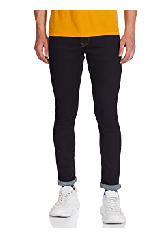

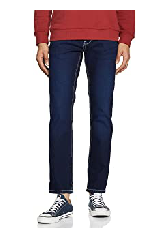

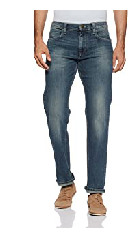

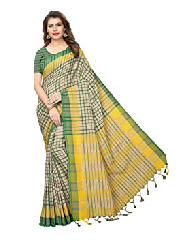

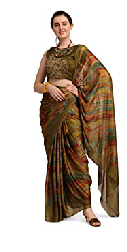

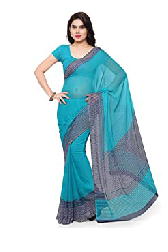

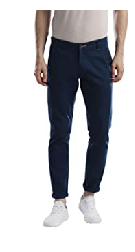

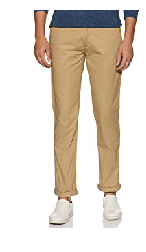

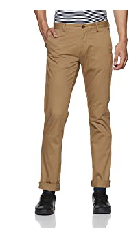

In [3]:
# Let's try to print some of the scrapped images from each category
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

train_jeans=r'clothes/train/Jeans_Images'
train_saree=r'clothes/train/Sarees_Images'
train_trouser=r'clothes/train/Trousers_Images'


Cloth_train=[train_jeans, train_saree, train_trouser]
for dirs in Cloth_train:
    k=listdir(dirs)
    for i in k[:3]:
        img=mpimg.imread('{}/{}'.format(dirs,i))
        plt.imshow(img)
        plt.axis('off')
        plt.show()

In [4]:
file1 = os.listdir(r'clothes/train')
file2 = os.listdir(r'clothes/test')
file1, file2

(['Jeans_Images', 'Sarees_Images', 'Trousers_Images'],
 ['Jeans_Images', 'Sarees_Images', 'Trousers_Images'])

In [5]:
# Count of images in each folder
print("Count of Training Images")
print("No.of Images of Sarees in train dataset -> ",len(os.listdir(r'clothes/train/Sarees_Images')))
print("No.of Images of Jeans in train dataset -> ",len(os.listdir(r'clothes/train/Jeans_Images')))
print("No.of Images of Trousers in train dataset ->",len(os.listdir(r'clothes/train/Trousers_Images')))
"\n"

print("Count of Test Images")
print("No.of Images of Sarees in test dataset-> ",len(os.listdir(r'clothes/test/Sarees_Images')))
print("No.of Images of Jeans in test dataset ->",len(os.listdir(r'clothes/test/Jeans_Images')))
print("No.of Images of Trousers in test dataset-> ",len(os.listdir(r'clothes/test/Trousers_Images')))

Count of Training Images
No.of Images of Sarees in train dataset ->  331
No.of Images of Jeans in train dataset ->  331
No.of Images of Trousers in train dataset -> 331
Count of Test Images
No.of Images of Sarees in test dataset->  100
No.of Images of Jeans in test dataset -> 100
No.of Images of Trousers in test dataset->  100


### Model Building

In [6]:
#importing all the required libraries
import pandas as pd
import numpy as np
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation, Conv2D, MaxPooling2D,BatchNormalization
from tensorflow.keras import optimizers
from keras.models import load_model
from tensorflow.keras.preprocessing import image
import random
import scipy
import pylab as pl
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings 
warnings.filterwarnings("ignore")

In [8]:
#Defining dimensions of images and other parameters
input_shape=(128,128,3)
img_width=128
img_height=128
batch_size=12
epoch=100
train_samples=331
test_samples=100

In [9]:
# Data Augmentation on Training Images

Train_datagen=ImageDataGenerator(rescale=1./255,
                                             zoom_range=0.2,
                                             rotation_range=30,
                                             horizontal_flip=True)
Training_set=Train_datagen.flow_from_directory(train_data,
                                                              target_size=(img_width,img_height),
                                                              batch_size=batch_size, 
                                                              class_mode='categorical')

# Test Data Generator
Test_datagen=ImageDataGenerator(rescale=1./255)
Test_set=Test_datagen.flow_from_directory(test_data,
                                                  target_size=(img_width,img_height),
                                                  batch_size=batch_size, 
                                                  class_mode='categorical')

Found 993 images belonging to 3 classes.
Found 300 images belonging to 3 classes.


In [10]:
# Creating the model
model=Sequential()

# First convolution layer
model.add(Conv2D(32,(3,3),input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Second convolution layer
model.add(Conv2D(32,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Third convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Fourth convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))


model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(3))
model.add(Activation('softmax'))

print(model.summary())

model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 activation (Activation)     (None, 126, 126, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 63, 63, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        9248      
                                                                 
 activation_1 (Activation)   (None, 61, 61, 32)        0         
                                                        

In [11]:
# Defining Early stopping and Model check point
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

ES = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=30)
MC = ModelCheckpoint('best.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

In [12]:
# Fitting the Training Data
history = model.fit(
    Training_set, 
    epochs=epoch,
    validation_data=Test_set,
    validation_steps=test_samples//batch_size,
    steps_per_epoch=train_samples//batch_size,
    callbacks=[ES,MC])

Epoch 1/100
27/27 [==============================] - ETA: 0s - loss: 1.0878 - accuracy: 0.4444
Epoch 00001: val_accuracy improved from -inf to 0.52083, saving model to best.h5
27/27 [==============================] - 36s 1s/step - loss: 1.0878 - accuracy: 0.4444 - val_loss: 1.0549 - val_accuracy: 0.5208
Epoch 2/100
27/27 [==============================] - ETA: 0s - loss: 0.8333 - accuracy: 0.6049
Epoch 00002: val_accuracy improved from 0.52083 to 0.63542, saving model to best.h5
27/27 [==============================] - 22s 807ms/step - loss: 0.8333 - accuracy: 0.6049 - val_loss: 0.7600 - val_accuracy: 0.6354
Epoch 3/100
27/27 [==============================] - ETA: 0s - loss: 0.6327 - accuracy: 0.6543
Epoch 00003: val_accuracy improved from 0.63542 to 0.70833, saving model to best.h5
27/27 [==============================] - 22s 792ms/step - loss: 0.6327 - accuracy: 0.6543 - val_loss: 0.6722 - val_accuracy: 0.7083
Epoch 4/100
27/27 [==============================] - ETA: 0s - loss: 0.58

Epoch 30/100
27/27 [==============================] - ETA: 0s - loss: 0.3988 - accuracy: 0.8193
Epoch 00030: val_accuracy did not improve from 0.86458
27/27 [==============================] - 21s 769ms/step - loss: 0.3988 - accuracy: 0.8193 - val_loss: 0.6077 - val_accuracy: 0.7188
Epoch 31/100
27/27 [==============================] - ETA: 0s - loss: 0.4482 - accuracy: 0.7716
Epoch 00031: val_accuracy improved from 0.86458 to 0.92708, saving model to best.h5
27/27 [==============================] - 21s 784ms/step - loss: 0.4482 - accuracy: 0.7716 - val_loss: 0.3359 - val_accuracy: 0.9271
Epoch 32/100
27/27 [==============================] - ETA: 0s - loss: 0.3783 - accuracy: 0.8179
Epoch 00032: val_accuracy did not improve from 0.92708
27/27 [==============================] - 22s 816ms/step - loss: 0.3783 - accuracy: 0.8179 - val_loss: 0.4079 - val_accuracy: 0.8229
Epoch 33/100
27/27 [==============================] - ETA: 0s - loss: 0.4499 - accuracy: 0.8100
Epoch 00033: val_accuracy 

Epoch 59/100
27/27 [==============================] - ETA: 0s - loss: 0.2924 - accuracy: 0.8847
Epoch 00059: val_accuracy did not improve from 0.92708
27/27 [==============================] - 22s 825ms/step - loss: 0.2924 - accuracy: 0.8847 - val_loss: 0.8876 - val_accuracy: 0.6875
Epoch 60/100
27/27 [==============================] - ETA: 0s - loss: 0.3327 - accuracy: 0.8333
Epoch 00060: val_accuracy did not improve from 0.92708
27/27 [==============================] - 22s 801ms/step - loss: 0.3327 - accuracy: 0.8333 - val_loss: 0.4700 - val_accuracy: 0.8021
Epoch 61/100
27/27 [==============================] - ETA: 0s - loss: 0.3928 - accuracy: 0.8117
Epoch 00061: val_accuracy did not improve from 0.92708
27/27 [==============================] - 21s 779ms/step - loss: 0.3928 - accuracy: 0.8117 - val_loss: 0.4103 - val_accuracy: 0.8750
Epoch 62/100
27/27 [==============================] - ETA: 0s - loss: 0.3446 - accuracy: 0.8611
Epoch 00062: val_accuracy did not improve from 0.92708


Epoch 88/100
27/27 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.8692
Epoch 00088: val_accuracy did not improve from 0.92708
27/27 [==============================] - 22s 795ms/step - loss: 0.3169 - accuracy: 0.8692 - val_loss: 0.3038 - val_accuracy: 0.8854
Epoch 89/100
27/27 [==============================] - ETA: 0s - loss: 0.3160 - accuracy: 0.8567
Epoch 00089: val_accuracy did not improve from 0.92708
27/27 [==============================] - 23s 831ms/step - loss: 0.3160 - accuracy: 0.8567 - val_loss: 0.3225 - val_accuracy: 0.8958
Epoch 90/100
27/27 [==============================] - ETA: 0s - loss: 0.3090 - accuracy: 0.8536
Epoch 00090: val_accuracy did not improve from 0.92708
27/27 [==============================] - 22s 823ms/step - loss: 0.3090 - accuracy: 0.8536 - val_loss: 0.3431 - val_accuracy: 0.8750
Epoch 91/100
27/27 [==============================] - ETA: 0s - loss: 0.2840 - accuracy: 0.8827
Epoch 00091: val_accuracy did not improve from 0.92708


In [13]:
#Saving the best model
model.save('best_model.h5')

In [14]:
table = pd.DataFrame(model.history.history)
table

,loss,accuracy,val_loss,val_accuracy
0,1.087826,0.444444,1.054933,0.520833
1,0.833277,0.604938,0.760027,0.635417
2,0.632747,0.654321,0.672222,0.708333
3,0.581894,0.706790,0.543458,0.666667
4,0.628642,0.654321,0.640937,0.677083
...,...,...,...,...
95,0.321039,0.870370,0.396202,0.833333
96,0.321461,0.854938,0.363202,0.875000
97,0.338626,0.845679,0.305929,0.895833
98,0.346047,0.827160,0.381366,0.875000


### Prediction

In [15]:
#Loading the saved model
saved_model = load_model('best_model.h5')

#creating instances where elements from test directory will be called
test_jeans=r'Clothes/Test/Jeans_Images'
test_saree=r'Clothes/Test/Sarees_Images'
test_trouser=r'Clothes/Test/Trousers_Images'

Input Image is: img1.jpeg


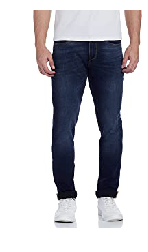

Predicted Label is: [2] 

Input Image is: img10.jpeg


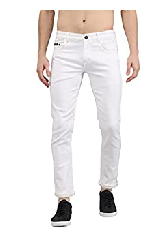

Predicted Label is: [0] 

Input Image is: img100.jpeg


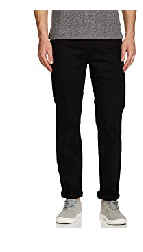

Predicted Label is: [2] 

Input Image is: img11.jpeg


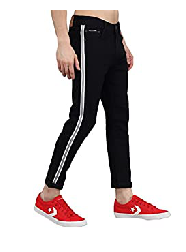

Predicted Label is: [0] 

Input Image is: img12.jpeg


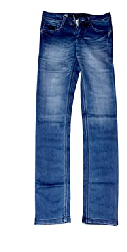

Predicted Label is: [0] 

Input Image is: img13.jpeg


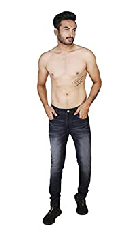

Predicted Label is: [0] 

Input Image is: img14.jpeg


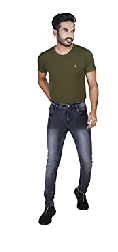

Predicted Label is: [2] 

Input Image is: img15.jpeg


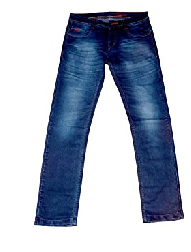

Predicted Label is: [0] 

Input Image is: img16.jpeg


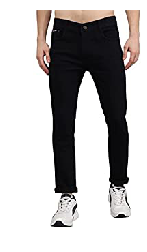

Predicted Label is: [0] 

Input Image is: img17.jpeg


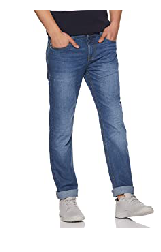

Predicted Label is: [0] 

Input Image is: img18.jpeg


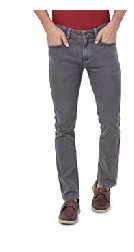

Predicted Label is: [0] 

Input Image is: img19.jpeg


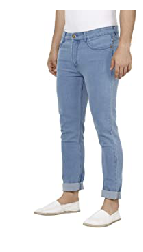

Predicted Label is: [0] 

Input Image is: img2.jpeg


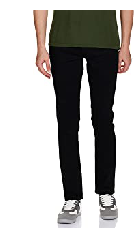

Predicted Label is: [0] 

Input Image is: img20.jpeg


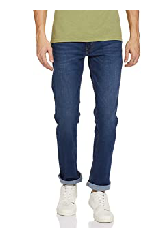

Predicted Label is: [0] 

Input Image is: img21.jpeg


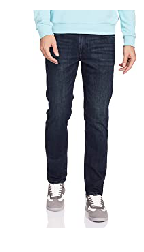

Predicted Label is: [0] 

Input Image is: img22.jpeg


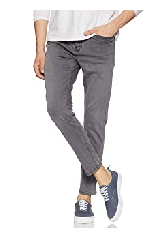

Predicted Label is: [0] 

Input Image is: img23.jpeg


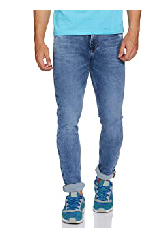

Predicted Label is: [0] 

Input Image is: img24.jpeg


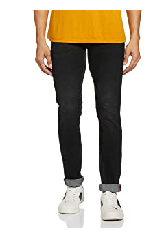

Predicted Label is: [0] 

Input Image is: img25.jpeg


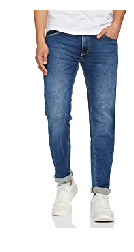

Predicted Label is: [0] 

Input Image is: img26.jpeg


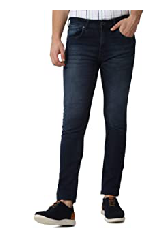

Predicted Label is: [0] 

Input Image is: img27.jpeg


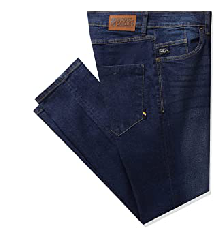

Predicted Label is: [2] 

Input Image is: img28.jpeg


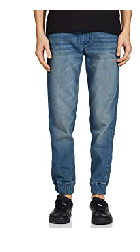

Predicted Label is: [0] 

Input Image is: img29.jpeg


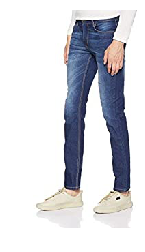

Predicted Label is: [0] 

Input Image is: img3.jpeg


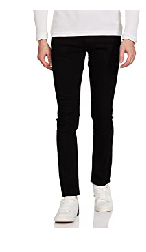

Predicted Label is: [0] 

Input Image is: img30.jpeg


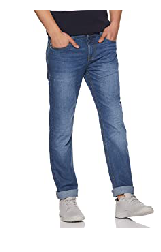

Predicted Label is: [0] 

Input Image is: img31.jpeg


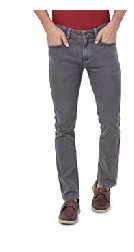

Predicted Label is: [0] 

Input Image is: img32.jpeg


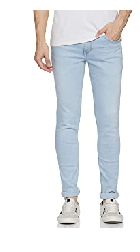

Predicted Label is: [0] 

Input Image is: img33.jpeg


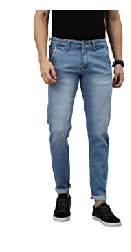

Predicted Label is: [0] 

Input Image is: img34.jpeg


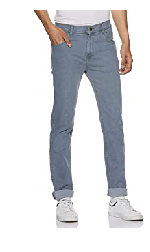

Predicted Label is: [0] 

Input Image is: img35.jpeg


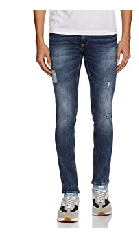

Predicted Label is: [0] 

Input Image is: img36.jpeg


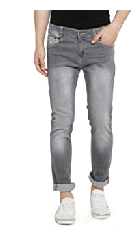

Predicted Label is: [2] 

Input Image is: img37.jpeg


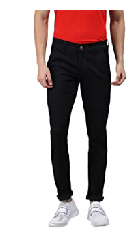

Predicted Label is: [2] 

Input Image is: img38.jpeg


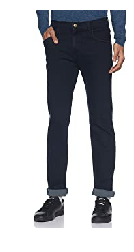

Predicted Label is: [2] 

Input Image is: img39.jpeg


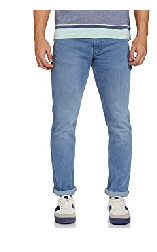

Predicted Label is: [0] 

Input Image is: img4.jpeg


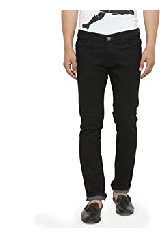

Predicted Label is: [0] 

Input Image is: img40.jpeg


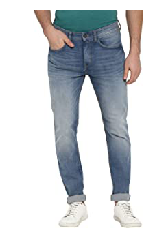

Predicted Label is: [0] 

Input Image is: img41.jpeg


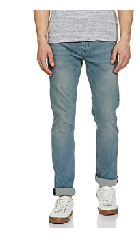

Predicted Label is: [0] 

Input Image is: img42.jpeg


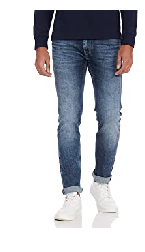

Predicted Label is: [0] 

Input Image is: img43.jpeg


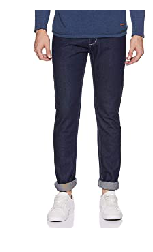

Predicted Label is: [0] 

Input Image is: img44.jpeg


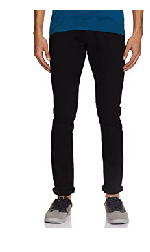

Predicted Label is: [0] 

Input Image is: img45.jpeg


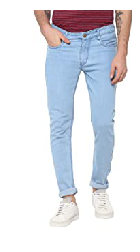

Predicted Label is: [0] 

Input Image is: img46.jpeg


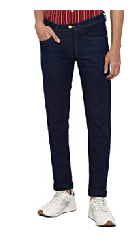

Predicted Label is: [0] 

Input Image is: img47.jpeg


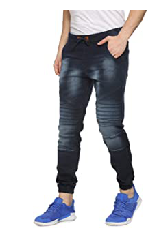

Predicted Label is: [2] 

Input Image is: img48.jpeg


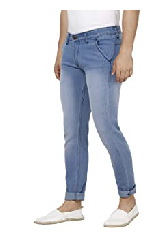

Predicted Label is: [0] 

Input Image is: img49.jpeg


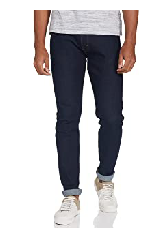

Predicted Label is: [2] 

Input Image is: img5.jpeg


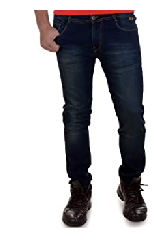

Predicted Label is: [0] 

Input Image is: img50.jpeg


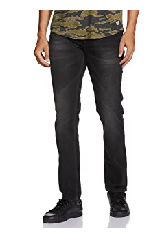

Predicted Label is: [0] 

Input Image is: img51.jpeg


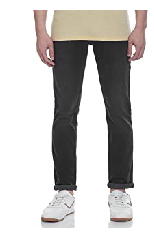

Predicted Label is: [0] 

Input Image is: img52.jpeg


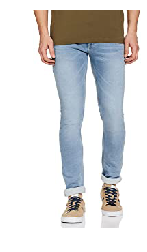

Predicted Label is: [0] 

Input Image is: img53.jpeg


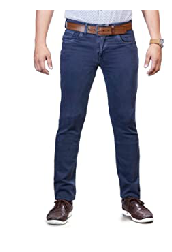

Predicted Label is: [0] 

Input Image is: img54.jpeg


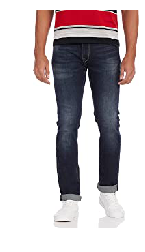

Predicted Label is: [2] 

Input Image is: img55.jpeg


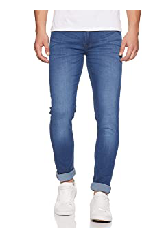

Predicted Label is: [0] 

Input Image is: img56.jpeg


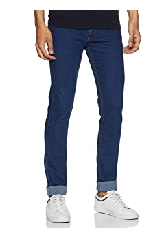

Predicted Label is: [0] 

Input Image is: img57.jpeg


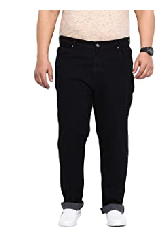

Predicted Label is: [2] 

Input Image is: img58.jpeg


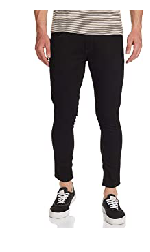

Predicted Label is: [0] 

Input Image is: img59.jpeg


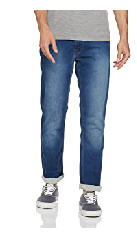

Predicted Label is: [0] 

Input Image is: img6.jpeg


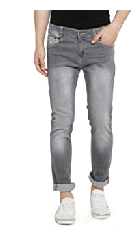

Predicted Label is: [2] 

Input Image is: img60.jpeg


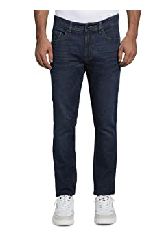

Predicted Label is: [2] 

Input Image is: img61.jpeg


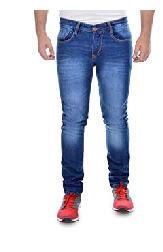

Predicted Label is: [2] 

Input Image is: img62.jpeg


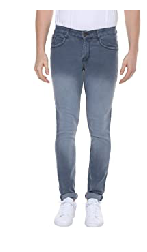

Predicted Label is: [0] 

Input Image is: img63.jpeg


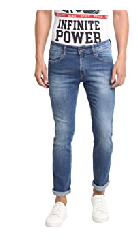

Predicted Label is: [0] 

Input Image is: img64.jpeg


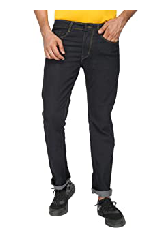

Predicted Label is: [0] 

Input Image is: img65.jpeg


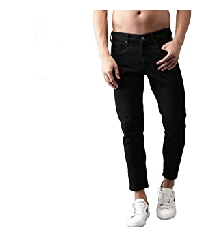

Predicted Label is: [0] 

Input Image is: img66.jpeg


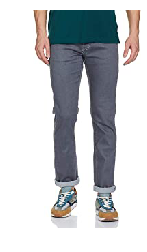

Predicted Label is: [0] 

Input Image is: img67.jpeg


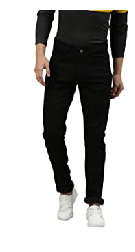

Predicted Label is: [2] 

Input Image is: img68.jpeg


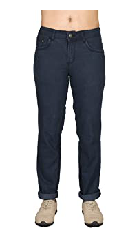

Predicted Label is: [2] 

Input Image is: img69.jpeg


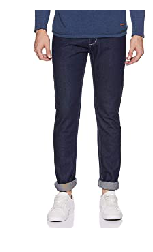

Predicted Label is: [0] 

Input Image is: img7.jpeg


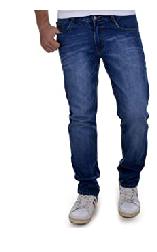

Predicted Label is: [0] 

Input Image is: img70.jpeg


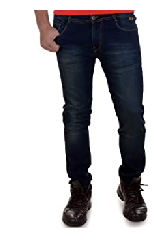

Predicted Label is: [0] 

Input Image is: img71.jpeg


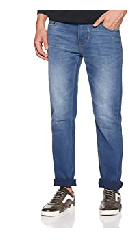

Predicted Label is: [0] 

Input Image is: img72.jpeg


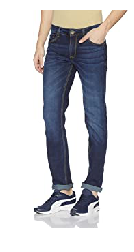

Predicted Label is: [0] 

Input Image is: img73.jpeg


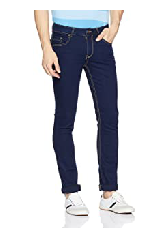

Predicted Label is: [2] 

Input Image is: img74.jpeg


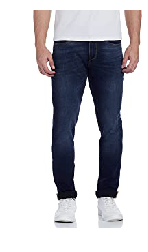

Predicted Label is: [2] 

Input Image is: img75.jpeg


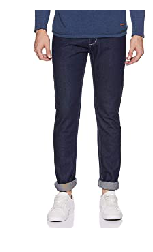

Predicted Label is: [0] 

Input Image is: img76.jpeg


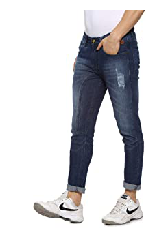

Predicted Label is: [0] 

Input Image is: img77.jpeg


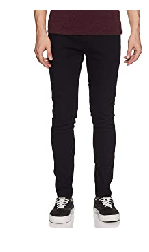

Predicted Label is: [0] 

Input Image is: img78.jpeg


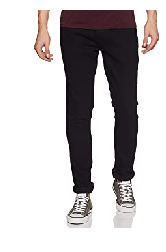

Predicted Label is: [0] 

Input Image is: img79.jpeg


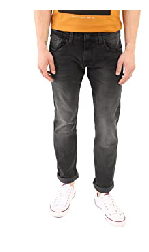

Predicted Label is: [0] 

Input Image is: img8.jpeg


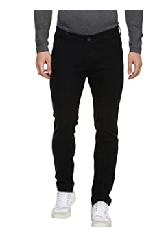

Predicted Label is: [2] 

Input Image is: img80.jpeg


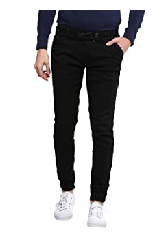

Predicted Label is: [2] 

Input Image is: img81.jpeg


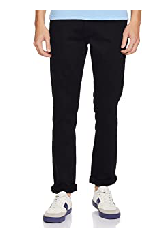

Predicted Label is: [0] 

Input Image is: img82.jpeg


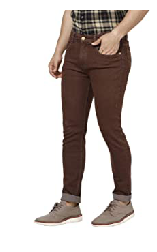

Predicted Label is: [2] 

Input Image is: img83.jpeg


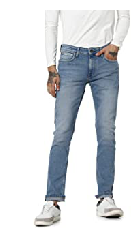

Predicted Label is: [0] 

Input Image is: img84.jpeg


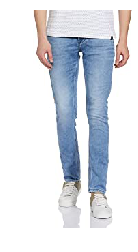

Predicted Label is: [0] 

Input Image is: img85.jpeg


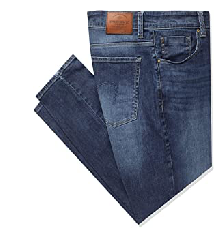

Predicted Label is: [2] 

Input Image is: img86.jpeg


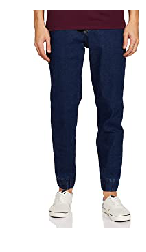

Predicted Label is: [0] 

Input Image is: img87.jpeg


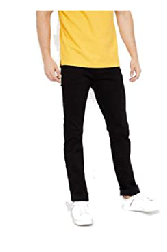

Predicted Label is: [2] 

Input Image is: img88.jpeg


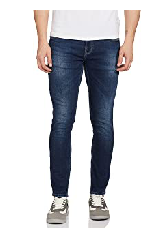

Predicted Label is: [0] 

Input Image is: img89.jpeg


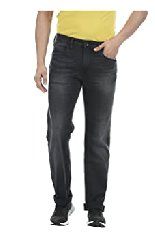

Predicted Label is: [0] 

Input Image is: img9.jpeg


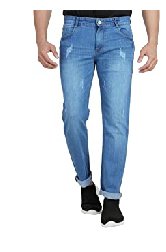

Predicted Label is: [0] 

Input Image is: img90.jpeg


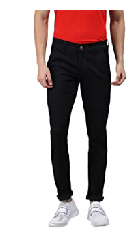

Predicted Label is: [2] 

Input Image is: img91.jpeg


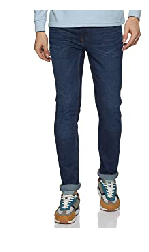

Predicted Label is: [0] 

Input Image is: img92.jpeg


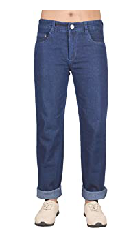

Predicted Label is: [0] 

Input Image is: img93.jpeg


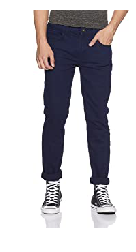

Predicted Label is: [0] 

Input Image is: img94.jpeg


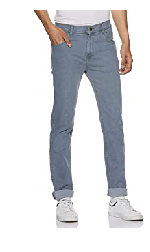

Predicted Label is: [0] 

Input Image is: img95.jpeg


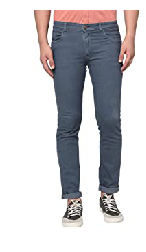

Predicted Label is: [2] 

Input Image is: img96.jpeg


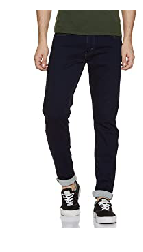

Predicted Label is: [0] 

Input Image is: img97.jpeg


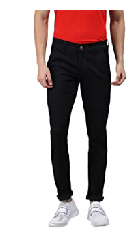

Predicted Label is: [2] 

Input Image is: img98.jpeg


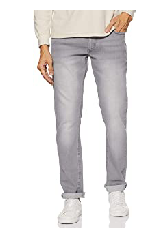

Predicted Label is: [0] 

Input Image is: img99.jpeg


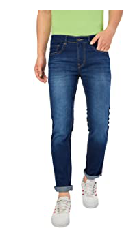

Predicted Label is: [2] 

Input Image is: img1.jpeg


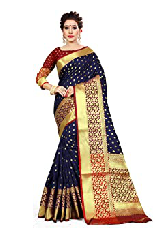

Predicted Label is: [1] 

Input Image is: img10.jpeg


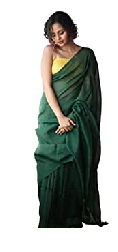

Predicted Label is: [1] 

Input Image is: img100.jpeg


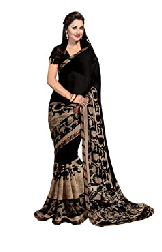

Predicted Label is: [0] 

Input Image is: img11.jpeg


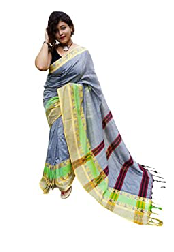

Predicted Label is: [0] 

Input Image is: img12.jpeg


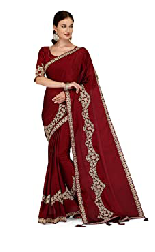

Predicted Label is: [1] 

Input Image is: img13.jpeg


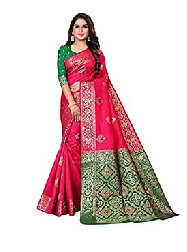

Predicted Label is: [1] 

Input Image is: img14.jpeg


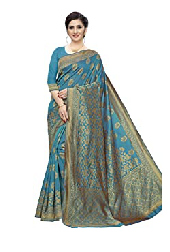

Predicted Label is: [1] 

Input Image is: img15.jpeg


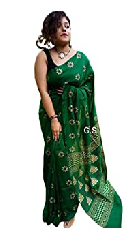

Predicted Label is: [1] 

Input Image is: img16.jpeg


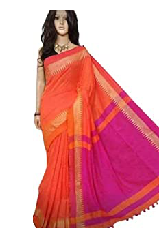

Predicted Label is: [1] 

Input Image is: img17.jpeg


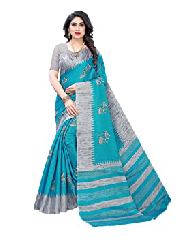

Predicted Label is: [1] 

Input Image is: img18.jpeg


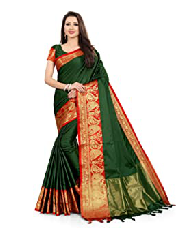

Predicted Label is: [1] 

Input Image is: img19.jpeg


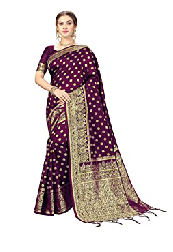

Predicted Label is: [1] 

Input Image is: img2.jpeg


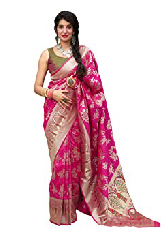

Predicted Label is: [1] 

Input Image is: img20.jpeg


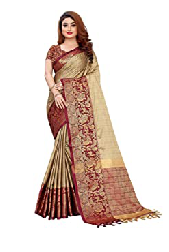

Predicted Label is: [1] 

Input Image is: img21.jpeg


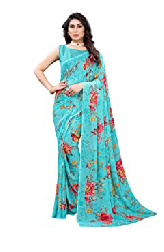

Predicted Label is: [1] 

Input Image is: img22.jpeg


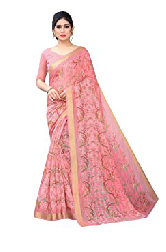

Predicted Label is: [1] 

Input Image is: img23.jpeg


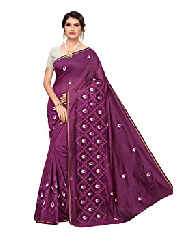

Predicted Label is: [1] 

Input Image is: img24.jpeg


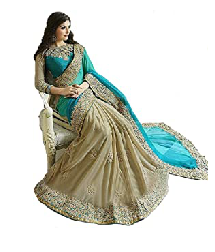

Predicted Label is: [1] 

Input Image is: img25.jpeg


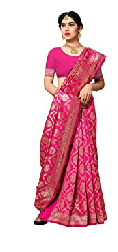

Predicted Label is: [1] 

Input Image is: img26.jpeg


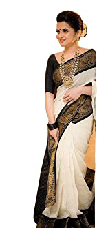

Predicted Label is: [1] 

Input Image is: img27.jpeg


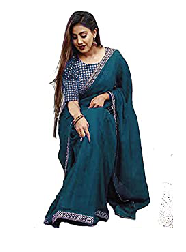

Predicted Label is: [1] 

Input Image is: img28.jpeg


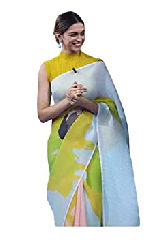

Predicted Label is: [1] 

Input Image is: img29.jpeg


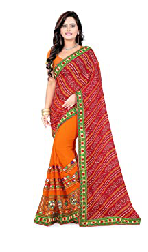

Predicted Label is: [1] 

Input Image is: img3.jpeg


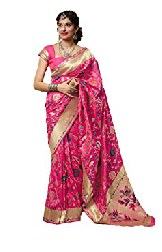

Predicted Label is: [1] 

Input Image is: img30.jpeg


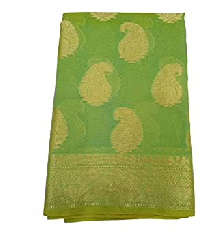

Predicted Label is: [1] 

Input Image is: img31.jpeg


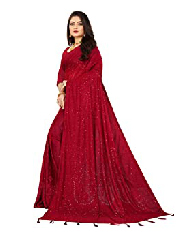

Predicted Label is: [1] 

Input Image is: img32.jpeg


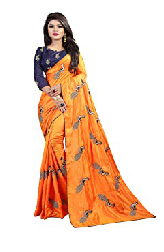

Predicted Label is: [1] 

Input Image is: img33.jpeg


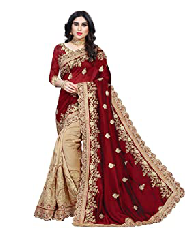

Predicted Label is: [1] 

Input Image is: img34.jpeg


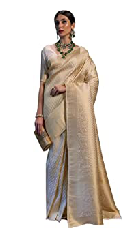

Predicted Label is: [1] 

Input Image is: img35.jpeg


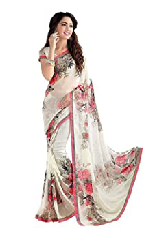

Predicted Label is: [1] 

Input Image is: img36.jpeg


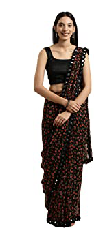

Predicted Label is: [1] 

Input Image is: img37.jpeg


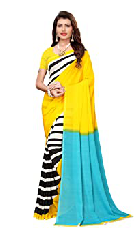

Predicted Label is: [1] 

Input Image is: img38.jpeg


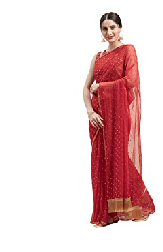

Predicted Label is: [1] 

Input Image is: img39.jpeg


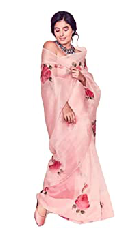

Predicted Label is: [1] 

Input Image is: img4.jpeg


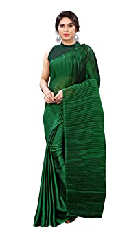

Predicted Label is: [1] 

Input Image is: img40.jpeg


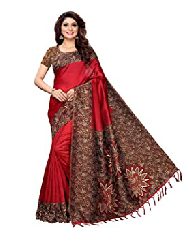

Predicted Label is: [1] 

Input Image is: img41.jpeg


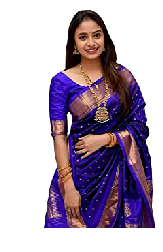

Predicted Label is: [1] 

Input Image is: img42.jpeg


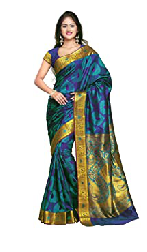

Predicted Label is: [1] 

Input Image is: img43.jpeg


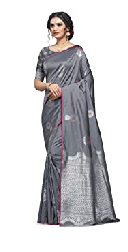

Predicted Label is: [1] 

Input Image is: img44.jpeg


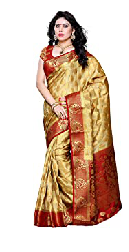

Predicted Label is: [1] 

Input Image is: img45.jpeg


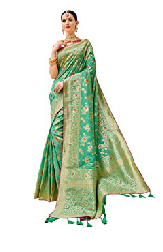

Predicted Label is: [1] 

Input Image is: img46.jpeg


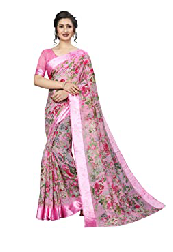

Predicted Label is: [0] 

Input Image is: img47.jpeg


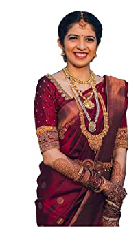

Predicted Label is: [1] 

Input Image is: img48.jpeg


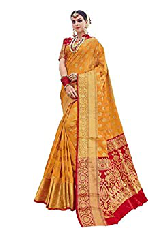

Predicted Label is: [1] 

Input Image is: img49.jpeg


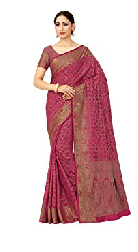

Predicted Label is: [1] 

Input Image is: img5.jpeg


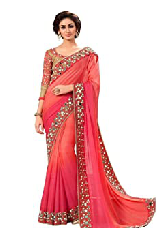

Predicted Label is: [1] 

Input Image is: img50.jpeg


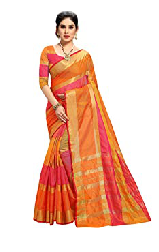

Predicted Label is: [1] 

Input Image is: img51.jpeg


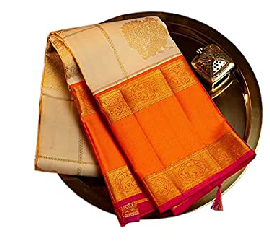

Predicted Label is: [1] 

Input Image is: img52.jpeg


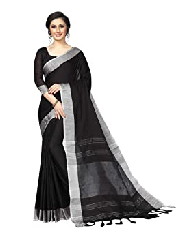

Predicted Label is: [0] 

Input Image is: img53.jpeg


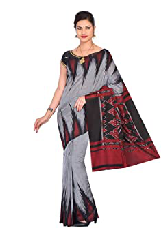

Predicted Label is: [1] 

Input Image is: img54.jpeg


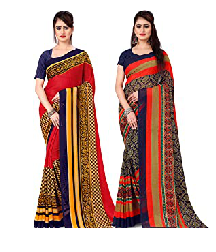

Predicted Label is: [1] 

Input Image is: img55.jpeg


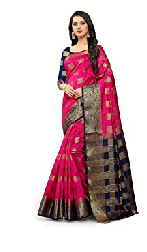

Predicted Label is: [1] 

Input Image is: img56.jpeg


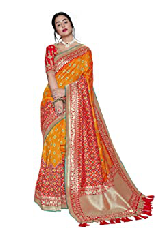

Predicted Label is: [1] 

Input Image is: img57.jpeg


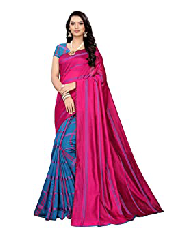

Predicted Label is: [1] 

Input Image is: img58.jpeg


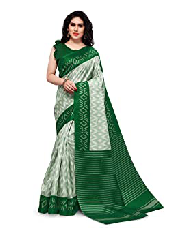

Predicted Label is: [1] 

Input Image is: img59.jpeg


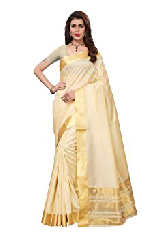

Predicted Label is: [1] 

Input Image is: img6.jpeg


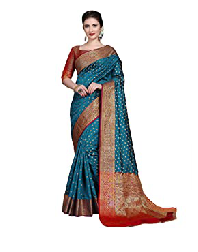

Predicted Label is: [1] 

Input Image is: img60.jpeg


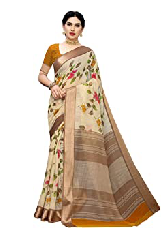

Predicted Label is: [1] 

Input Image is: img61.jpeg


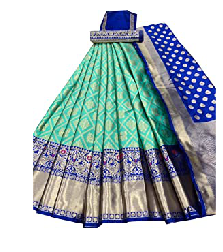

Predicted Label is: [0] 

Input Image is: img62.jpeg


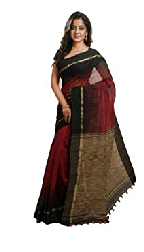

Predicted Label is: [1] 

Input Image is: img63.jpeg


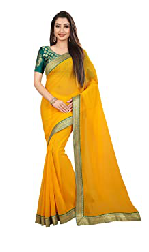

Predicted Label is: [1] 

Input Image is: img64.jpeg


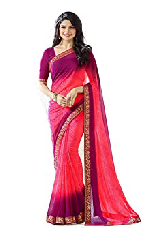

Predicted Label is: [1] 

Input Image is: img65.jpeg


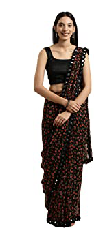

Predicted Label is: [1] 

Input Image is: img66.jpeg


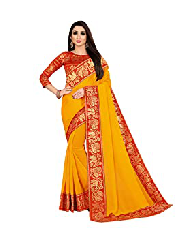

Predicted Label is: [1] 

Input Image is: img67.jpeg


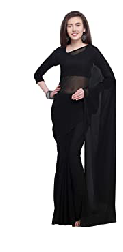

Predicted Label is: [1] 

Input Image is: img68.jpeg


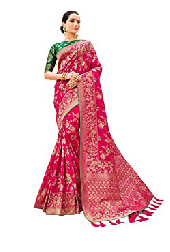

Predicted Label is: [1] 

Input Image is: img69.jpeg


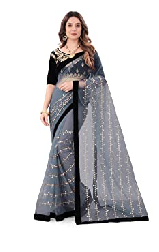

Predicted Label is: [1] 

Input Image is: img7.jpeg


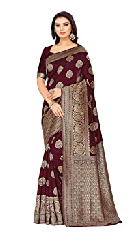

Predicted Label is: [1] 

Input Image is: img70.jpeg


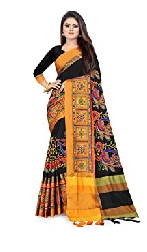

Predicted Label is: [1] 

Input Image is: img71.jpeg


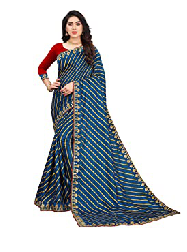

Predicted Label is: [1] 

Input Image is: img72.jpeg


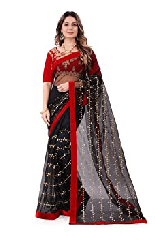

Predicted Label is: [1] 

Input Image is: img73.jpeg


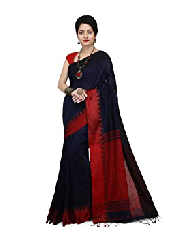

Predicted Label is: [1] 

Input Image is: img74.jpeg


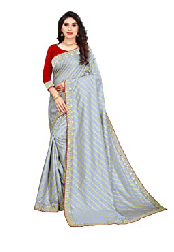

Predicted Label is: [1] 

Input Image is: img75.jpeg


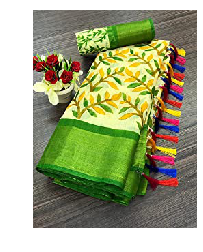

Predicted Label is: [1] 

Input Image is: img76.jpeg


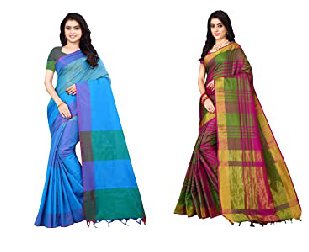

Predicted Label is: [1] 

Input Image is: img77.jpeg


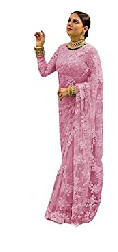

Predicted Label is: [1] 

Input Image is: img78.jpeg


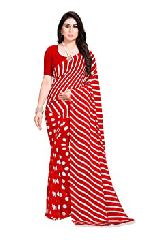

Predicted Label is: [1] 

Input Image is: img79.jpeg


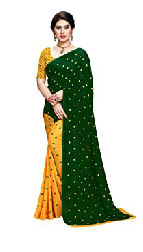

Predicted Label is: [1] 

Input Image is: img8.jpeg


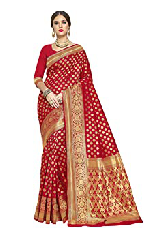

Predicted Label is: [1] 

Input Image is: img80.jpeg


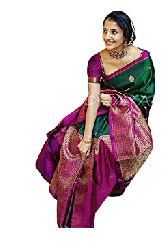

Predicted Label is: [1] 

Input Image is: img81.jpeg


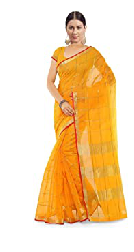

Predicted Label is: [1] 

Input Image is: img82.jpeg


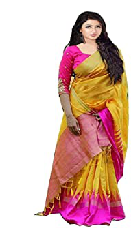

Predicted Label is: [1] 

Input Image is: img83.jpeg


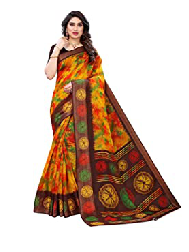

Predicted Label is: [1] 

Input Image is: img84.jpeg


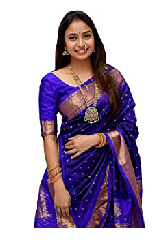

Predicted Label is: [1] 

Input Image is: img85.jpeg


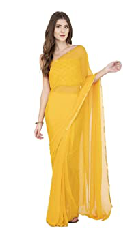

Predicted Label is: [1] 

Input Image is: img86.jpeg


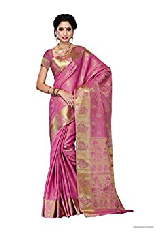

Predicted Label is: [1] 

Input Image is: img87.jpeg


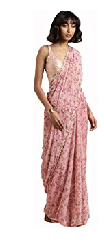

Predicted Label is: [1] 

Input Image is: img88.jpeg


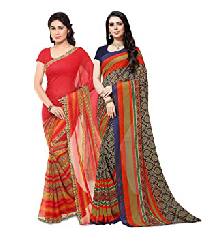

Predicted Label is: [1] 

Input Image is: img89.jpeg


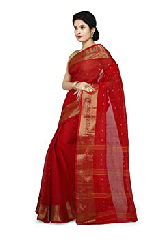

Predicted Label is: [1] 

Input Image is: img9.jpeg


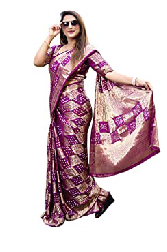

Predicted Label is: [1] 

Input Image is: img90.jpeg


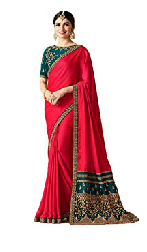

Predicted Label is: [1] 

Input Image is: img91.jpeg


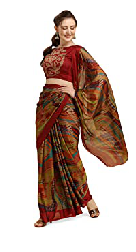

Predicted Label is: [1] 

Input Image is: img92.jpeg


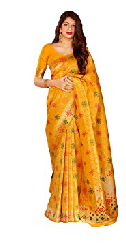

Predicted Label is: [1] 

Input Image is: img93.jpeg


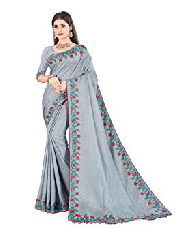

Predicted Label is: [0] 

Input Image is: img94.jpeg


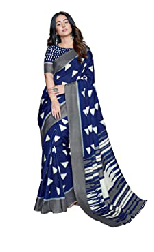

Predicted Label is: [1] 

Input Image is: img95.jpeg


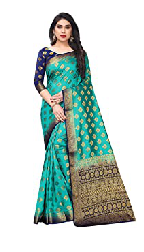

Predicted Label is: [1] 

Input Image is: img96.jpeg


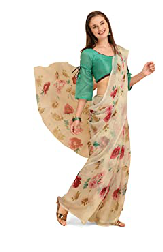

Predicted Label is: [1] 

Input Image is: img97.jpeg


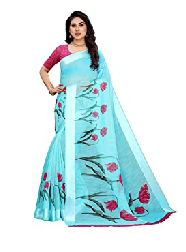

Predicted Label is: [1] 

Input Image is: img98.jpeg


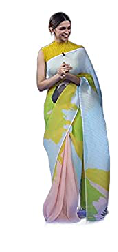

Predicted Label is: [1] 

Input Image is: img99.jpeg


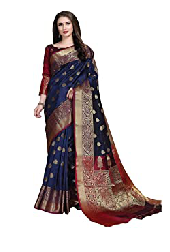

Predicted Label is: [0] 

Input Image is: img1.jpeg


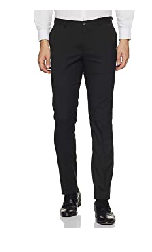

Predicted Label is: [2] 

Input Image is: img10.jpeg


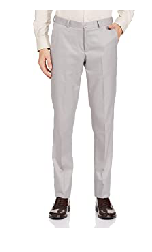

Predicted Label is: [0] 

Input Image is: img100.jpeg


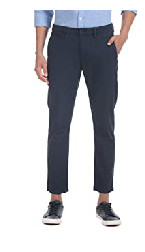

Predicted Label is: [2] 

Input Image is: img11.jpeg


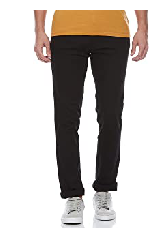

Predicted Label is: [0] 

Input Image is: img12.jpeg


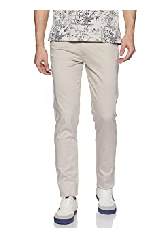

Predicted Label is: [0] 

Input Image is: img13.jpeg


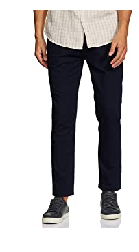

Predicted Label is: [0] 

Input Image is: img14.jpeg


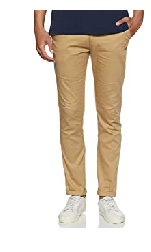

Predicted Label is: [2] 

Input Image is: img15.jpeg


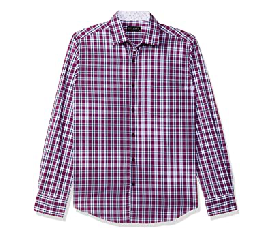

Predicted Label is: [0] 

Input Image is: img16.jpeg


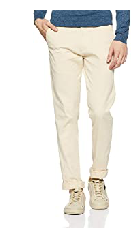

Predicted Label is: [2] 

Input Image is: img17.jpeg


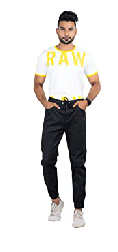

Predicted Label is: [0] 

Input Image is: img18.jpeg


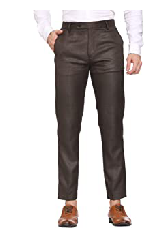

Predicted Label is: [2] 

Input Image is: img19.jpeg


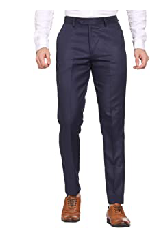

Predicted Label is: [2] 

Input Image is: img2.jpeg


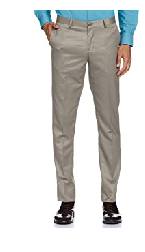

Predicted Label is: [2] 

Input Image is: img20.jpeg


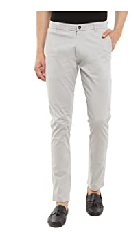

Predicted Label is: [0] 

Input Image is: img21.jpeg


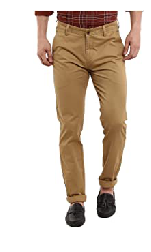

Predicted Label is: [2] 

Input Image is: img22.jpeg


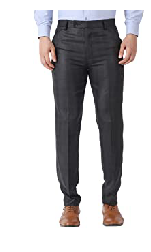

Predicted Label is: [2] 

Input Image is: img23.jpeg


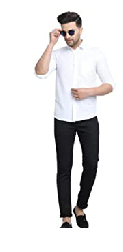

Predicted Label is: [0] 

Input Image is: img24.jpeg


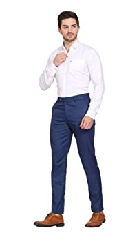

Predicted Label is: [0] 

Input Image is: img25.jpeg


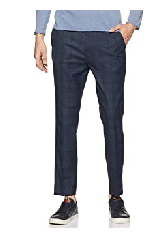

Predicted Label is: [2] 

Input Image is: img26.jpeg


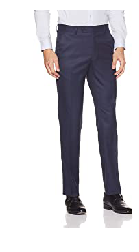

Predicted Label is: [2] 

Input Image is: img27.jpeg


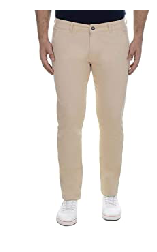

Predicted Label is: [2] 

Input Image is: img28.jpeg


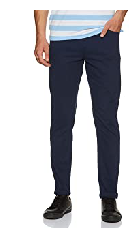

Predicted Label is: [0] 

Input Image is: img29.jpeg


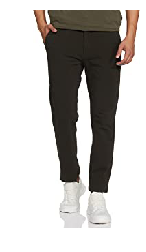

Predicted Label is: [2] 

Input Image is: img3.jpeg


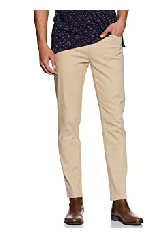

Predicted Label is: [2] 

Input Image is: img30.jpeg


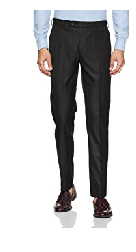

Predicted Label is: [2] 

Input Image is: img31.jpeg


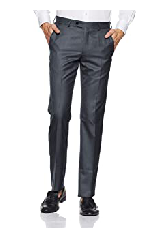

Predicted Label is: [0] 

Input Image is: img32.jpeg


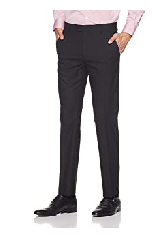

Predicted Label is: [2] 

Input Image is: img33.jpeg


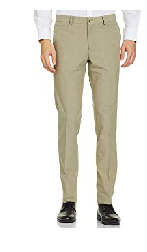

Predicted Label is: [2] 

Input Image is: img34.jpeg


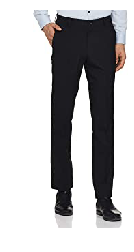

Predicted Label is: [2] 

Input Image is: img35.jpeg


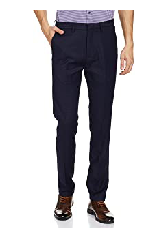

Predicted Label is: [2] 

Input Image is: img36.jpeg


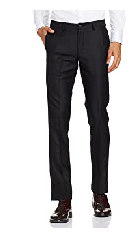

Predicted Label is: [2] 

Input Image is: img37.jpeg


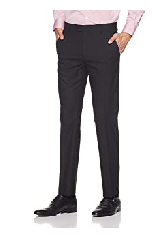

Predicted Label is: [2] 

Input Image is: img38.jpeg


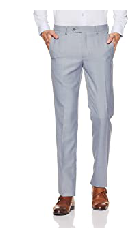

Predicted Label is: [0] 

Input Image is: img39.jpeg


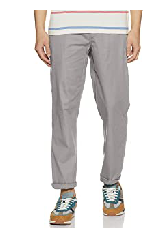

Predicted Label is: [2] 

Input Image is: img4.jpeg


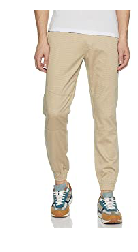

Predicted Label is: [2] 

Input Image is: img40.jpeg


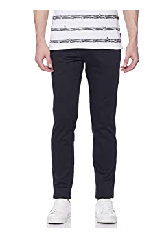

Predicted Label is: [0] 

Input Image is: img41.jpeg


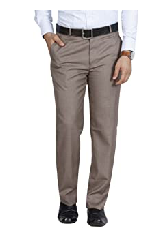

Predicted Label is: [2] 

Input Image is: img42.jpeg


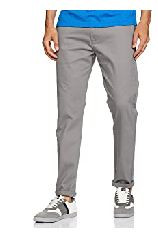

Predicted Label is: [0] 

Input Image is: img43.jpeg


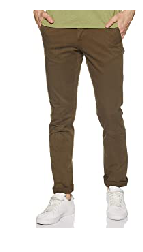

Predicted Label is: [2] 

Input Image is: img44.jpeg


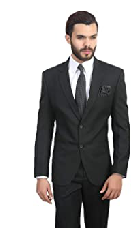

Predicted Label is: [1] 

Input Image is: img45.jpeg


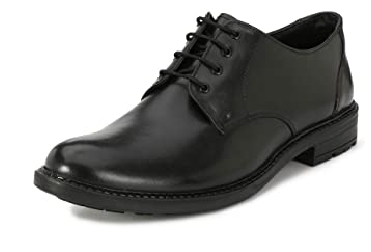

Predicted Label is: [1] 

Input Image is: img46.jpeg


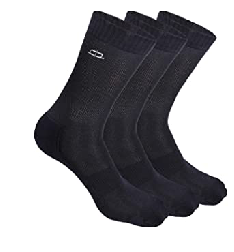

Predicted Label is: [1] 

Input Image is: img47.jpeg


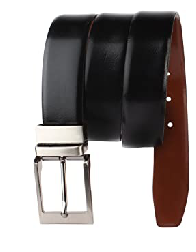

Predicted Label is: [2] 

Input Image is: img48.jpeg


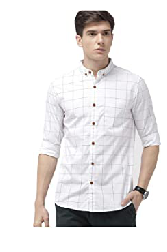

Predicted Label is: [0] 

Input Image is: img49.jpeg


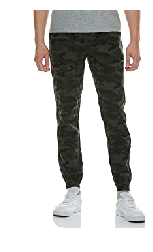

Predicted Label is: [2] 

Input Image is: img5.jpeg


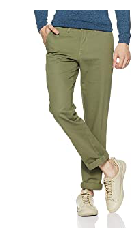

Predicted Label is: [2] 

Input Image is: img50.jpeg


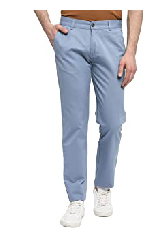

Predicted Label is: [0] 

Input Image is: img51.jpeg


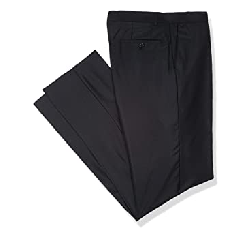

Predicted Label is: [2] 

Input Image is: img52.jpeg


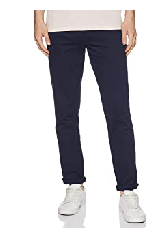

Predicted Label is: [0] 

Input Image is: img53.jpeg


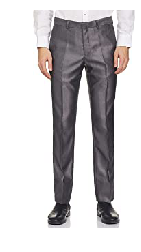

Predicted Label is: [2] 

Input Image is: img54.jpeg


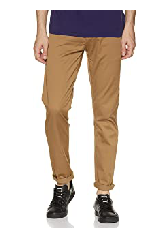

Predicted Label is: [2] 

Input Image is: img55.jpeg


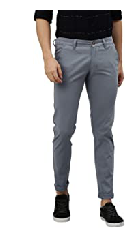

Predicted Label is: [2] 

Input Image is: img56.jpeg


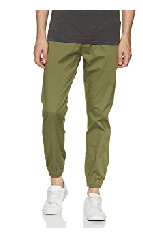

Predicted Label is: [2] 

Input Image is: img57.jpeg


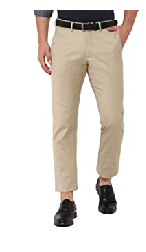

Predicted Label is: [2] 

Input Image is: img58.jpeg


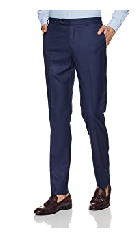

Predicted Label is: [2] 

Input Image is: img59.jpeg


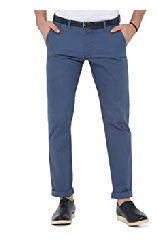

Predicted Label is: [0] 

Input Image is: img6.jpeg


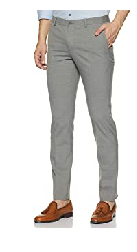

Predicted Label is: [2] 

Input Image is: img60.jpeg


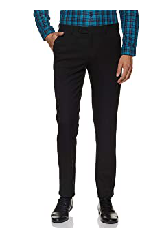

Predicted Label is: [2] 

Input Image is: img61.jpeg


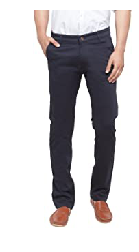

Predicted Label is: [2] 

Input Image is: img62.jpeg


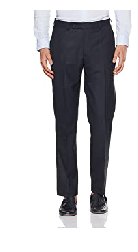

Predicted Label is: [2] 

Input Image is: img63.jpeg


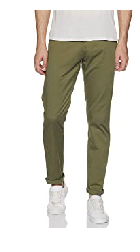

Predicted Label is: [2] 

Input Image is: img64.jpeg


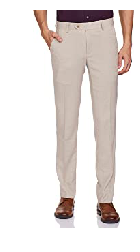

Predicted Label is: [2] 

Input Image is: img65.jpeg


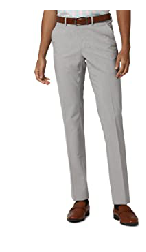

Predicted Label is: [0] 

Input Image is: img66.jpeg


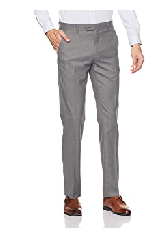

Predicted Label is: [2] 

Input Image is: img67.jpeg


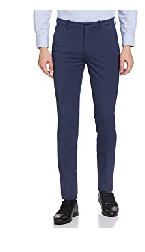

Predicted Label is: [2] 

Input Image is: img68.jpeg


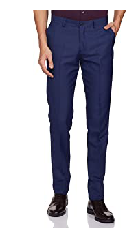

Predicted Label is: [2] 

Input Image is: img69.jpeg


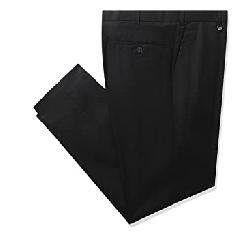

Predicted Label is: [2] 

Input Image is: img7.jpeg


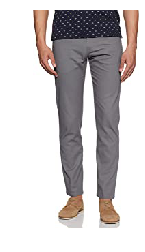

Predicted Label is: [2] 

Input Image is: img70.jpeg


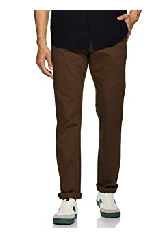

Predicted Label is: [2] 

Input Image is: img71.jpeg


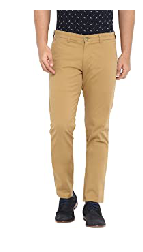

Predicted Label is: [2] 

Input Image is: img72.jpeg


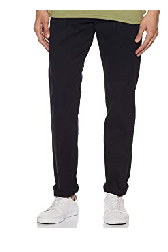

Predicted Label is: [0] 

Input Image is: img73.jpeg


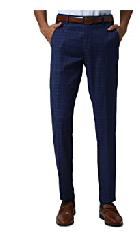

Predicted Label is: [2] 

Input Image is: img74.jpeg


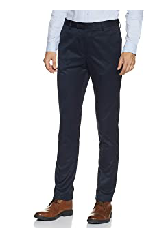

Predicted Label is: [2] 

Input Image is: img75.jpeg


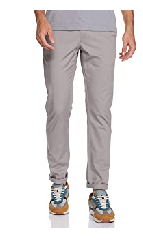

Predicted Label is: [0] 

Input Image is: img76.jpeg


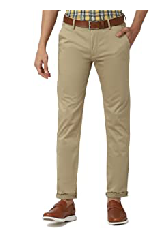

Predicted Label is: [2] 

Input Image is: img77.jpeg


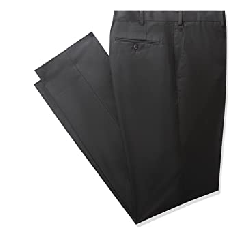

Predicted Label is: [2] 

Input Image is: img78.jpeg


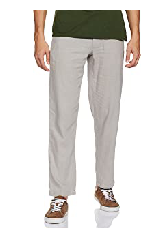

Predicted Label is: [0] 

Input Image is: img79.jpeg


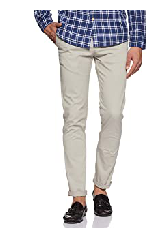

Predicted Label is: [0] 

Input Image is: img8.jpeg


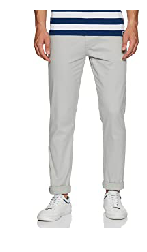

Predicted Label is: [0] 

Input Image is: img80.jpeg


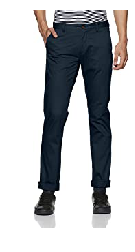

Predicted Label is: [0] 

Input Image is: img81.jpeg


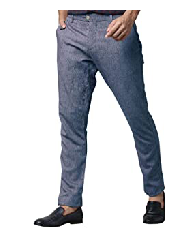

Predicted Label is: [0] 

Input Image is: img82.jpeg


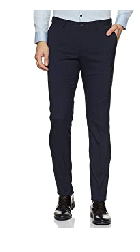

Predicted Label is: [2] 

Input Image is: img83.jpeg


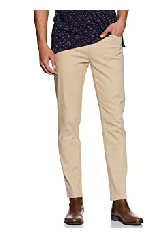

Predicted Label is: [2] 

Input Image is: img84.jpeg


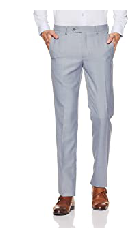

Predicted Label is: [0] 

Input Image is: img85.jpeg


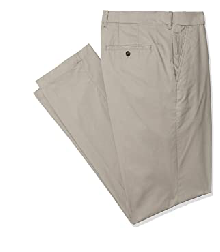

Predicted Label is: [0] 

Input Image is: img86.jpeg


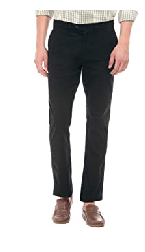

Predicted Label is: [0] 

Input Image is: img87.jpeg


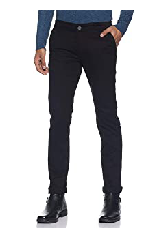

Predicted Label is: [0] 

Input Image is: img88.jpeg


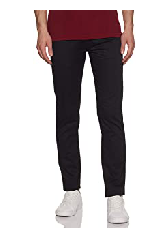

Predicted Label is: [0] 

Input Image is: img89.jpeg


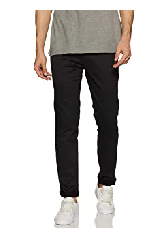

Predicted Label is: [2] 

Input Image is: img9.jpeg


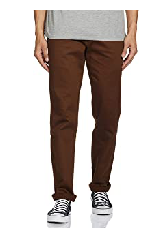

Predicted Label is: [2] 

Input Image is: img90.jpeg


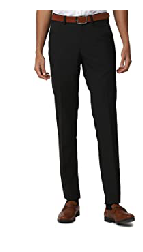

Predicted Label is: [2] 

Input Image is: img91.jpeg


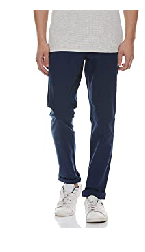

Predicted Label is: [0] 

Input Image is: img92.jpeg


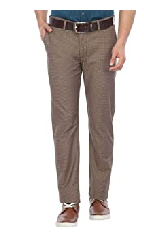

Predicted Label is: [2] 

Input Image is: img93.jpeg


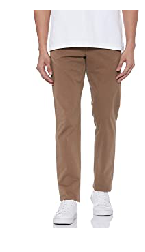

Predicted Label is: [2] 

Input Image is: img94.jpeg


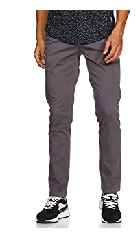

Predicted Label is: [0] 

Input Image is: img95.jpeg


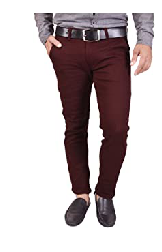

Predicted Label is: [2] 

Input Image is: img96.jpeg


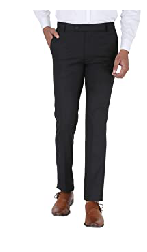

Predicted Label is: [0] 

Input Image is: img97.jpeg


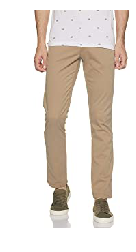

Predicted Label is: [2] 

Input Image is: img98.jpeg


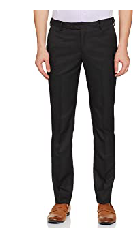

Predicted Label is: [2] 

Input Image is: img99.jpeg


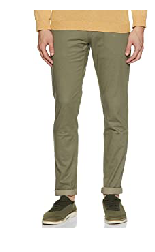

Predicted Label is: [2] 



In [16]:
test_dire=[test_jeans,test_saree,test_trouser]

for test_dir in test_dire:
    for i in listdir(test_dir):
        print("Input Image is:",i)
        img= image.load_img('{}/{}'.format(test_dir,i))                         
        test_image = image.load_img('{}/{}'.format(test_dir,i),target_size=(128, 128))
        test_image = image.img_to_array(test_image)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        test_image = np.expand_dims(test_image, axis=0)
        result = saved_model.predict(test_image)
        print("Predicted Label is:",np.argmax(result, axis=1),"\n")